# Electric Motor Speed Prediction

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
import joblib

In [3]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV

In [4]:
df = pd.read_csv('measures_v2.csv')
df.describe()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
count,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06
mean,5.427900e+01,3.622999e+01,6.634275e+01,-2.513381e+01,5.687858e+01,2.202081e+03,-6.871681e+01,3.741278e+01,5.850678e+01,4.818796e+01,2.456526e+01,3.110603e+01,4.079306e+01
std,4.417323e+01,2.178615e+01,2.867206e+01,6.309197e+01,2.295223e+01,1.859663e+03,6.493323e+01,9.218188e+01,1.900150e+01,1.999100e+01,1.929522e+00,7.713575e+01,2.504549e+01
min,-2.529093e+01,1.062375e+01,1.858582e+01,-1.315304e+02,1.813398e+01,-2.755491e+02,-2.780036e+02,-2.934268e+02,2.085696e+01,1.807669e+01,8.783478e+00,-2.464667e+02,2.000000e+00
25%,1.206992e+01,1.869814e+01,4.278796e+01,-7.869090e+01,3.841601e+01,3.171107e+02,-1.154061e+02,1.095863e+00,4.315158e+01,3.199033e+01,2.318480e+01,-1.374265e-01,1.700000e+01
50%,4.893818e+01,2.690014e+01,6.511013e+01,-7.429755e+00,5.603635e+01,1.999977e+03,-5.109376e+01,1.577401e+01,6.026629e+01,4.562551e+01,2.479733e+01,1.086035e+01,4.300000e+01
75%,9.003439e+01,4.985749e+01,8.814114e+01,1.470271e+00,7.558668e+01,3.760639e+03,-2.979688e+00,1.006121e+02,7.200837e+01,6.146083e+01,2.621702e+01,9.159718e+01,6.500000e+01
max,1.330370e+02,1.015985e+02,1.413629e+02,1.314698e+02,1.119464e+02,6.000015e+03,5.189670e-02,3.017079e+02,1.136066e+02,1.011480e+02,3.071420e+01,2.610057e+02,8.100000e+01


## Reorganizing the dataset

In [5]:
df.columns

Index(['u_q', 'coolant', 'stator_winding', 'u_d', 'stator_tooth',
       'motor_speed', 'i_d', 'i_q', 'pm', 'stator_yoke', 'ambient', 'torque',
       'profile_id'],
      dtype='object')

In [6]:
df = df[['u_q', 'u_d', 'i_d', 'i_q', 'coolant', 'stator_winding', 'stator_tooth', 
         'pm', 'stator_yoke', 'ambient', 'torque', 'motor_speed']]
df.columns

Index(['u_q', 'u_d', 'i_d', 'i_q', 'coolant', 'stator_winding', 'stator_tooth',
       'pm', 'stator_yoke', 'ambient', 'torque', 'motor_speed'],
      dtype='object')

## Separating the features and target variable

In [7]:
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values
print(X.shape, y.shape)

(1330816, 11) (1330816,)


## Splitting the dataset into training and test subsets

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(1064652, 11) (1064652,)
(266164, 11) (266164,)


## Feature Scaling

In [9]:
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

## Linear Regression

In [10]:
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

LinearRegression()

In [11]:
y_train_pred_lr = lr_model.predict(X_train_scaled)
y_test_pred_lr = lr_model.predict(X_test_scaled)

In [13]:
mse_train_lr = mean_squared_error(y_train, y_train_pred_lr)
mse_test_lr = mean_squared_error(y_test, y_test_pred_lr)
r2_train_lr = r2_score(y_train, y_train_pred_lr)
r2_test_lr = r2_score(y_test, y_test_pred_lr)

print('Train MSE:', round(mse_train_lr, 6)) # type: ignore
print('Test MSE:', round(mse_test_lr, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_lr, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_lr, 6)) # type: ignore

Train MSE: 218977.652042
Test MSE: 219977.086242
Train R2 Score: 0.936707
Test R2 Score: 0.936288


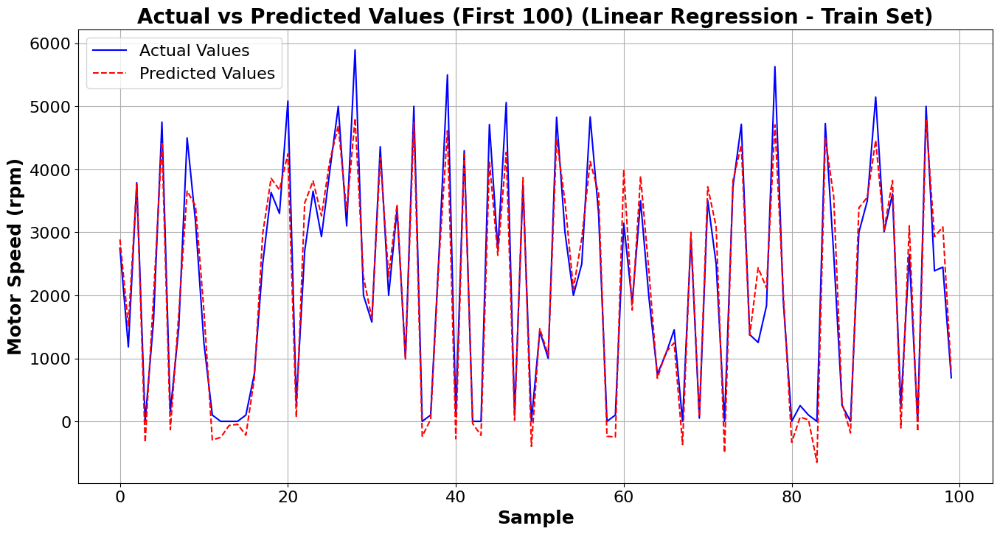

In [14]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_lr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Linear Regression - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

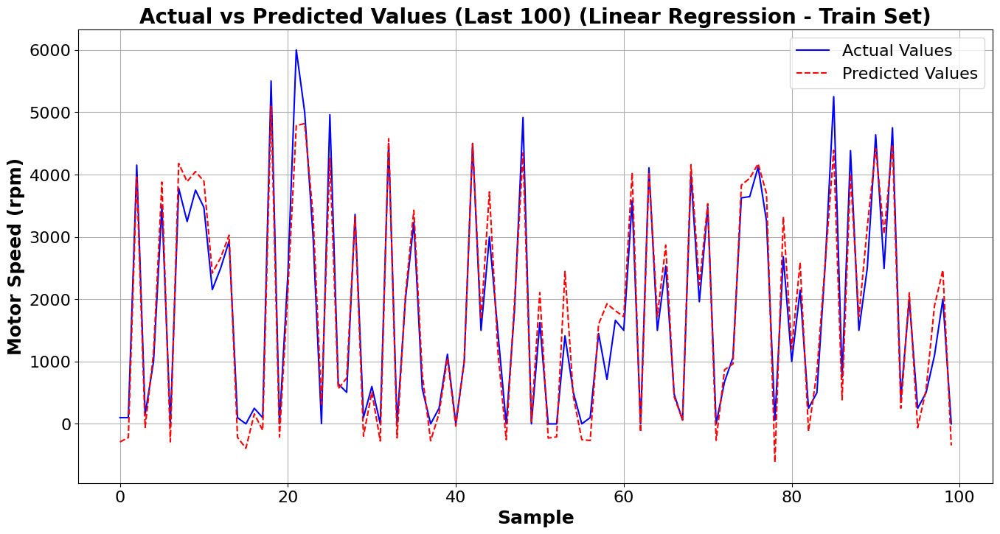

In [15]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_lr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Linear Regression - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

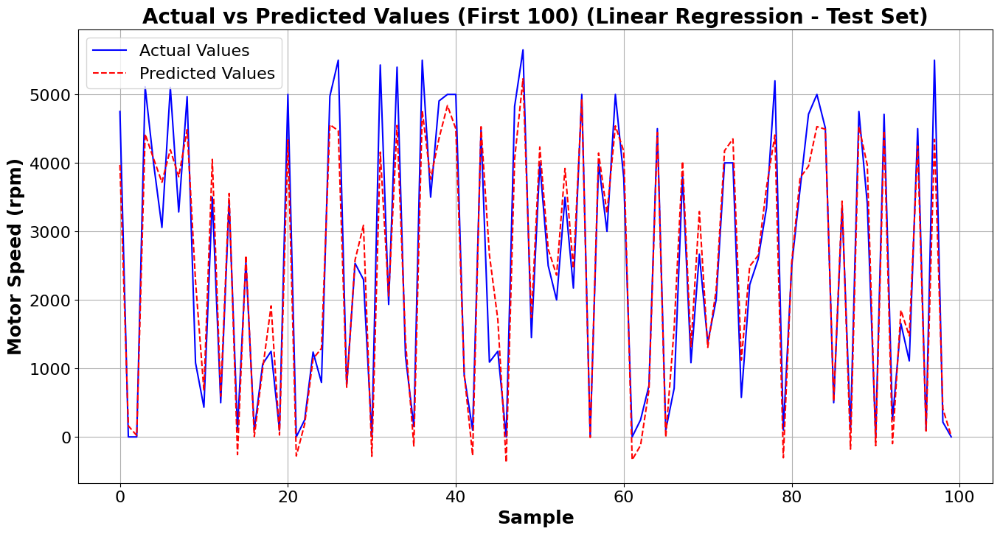

In [16]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_lr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Linear Regression - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

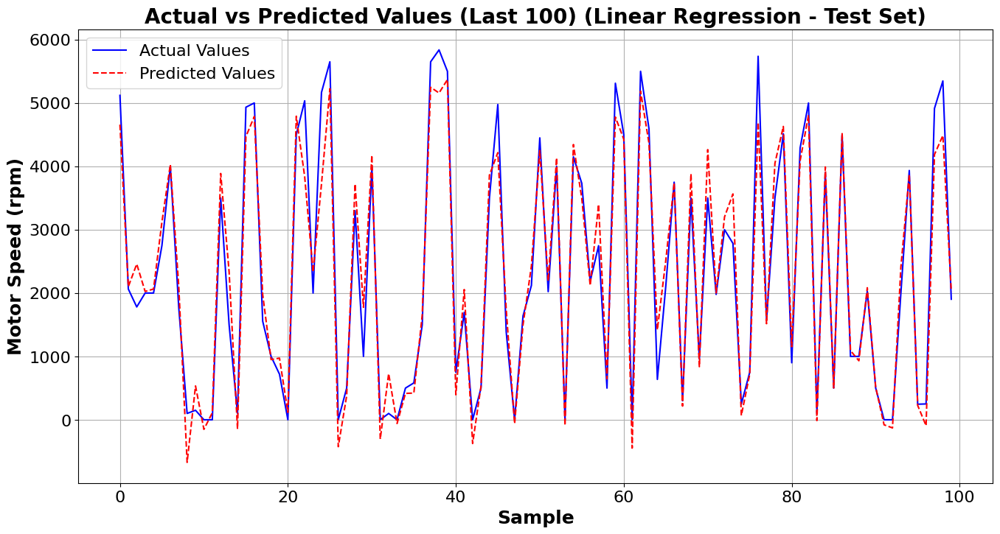

In [17]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_lr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Linear Regression - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [19]:
print('Coefficient and intercept for the model:')
print('Coefficients:',lr_model.coef_)
print('Intercept:',lr_model.intercept_)

Coefficient and intercept for the model:
Coefficients: [  973.29357131  -284.21653117 -1216.7882574    392.13797846
   809.03487241 -2165.07203984  4509.76234009   233.72145488
 -3246.95753972  -103.76103879  -774.8583728 ]
Intercept: 2203.2274989880984


In [20]:
print('Final Equation:')
print('Speed = {}*u_q + {}*u_d + {}*i_d + \n{}*i_q + {}*coolant + {}*stator_winding + \n{}*stator_tooth + {}*pm + {}*stator_yoke + \n{}*ambient + {}*torque + {}'.format(\
          round(lr_model.coef_[0],6), round(lr_model.coef_[1],6),
          round(lr_model.coef_[2],6), round(lr_model.coef_[3],6),
          round(lr_model.coef_[4],6), round(lr_model.coef_[5],6),
          round(lr_model.coef_[6],6), round(lr_model.coef_[7],6),
          round(lr_model.coef_[8],6), round(lr_model.coef_[9],6),
          round(lr_model.coef_[10],6), round(lr_model.intercept_,6))) # type: ignore

Final Equation:
Speed = 973.293571*u_q + -284.216531*u_d + -1216.788257*i_d + 
392.137978*i_q + 809.034872*coolant + -2165.07204*stator_winding + 
4509.76234*stator_tooth + 233.721455*pm + -3246.95754*stator_yoke + 
-103.761039*ambient + -774.858373*torque + 2203.227499


In [ ]:
# Saving the model
joblib.dump(lr_model,'LinearRegression_Speed.pkl')

['LinearRegression_Speed.pkl']

## Elastic Net

In [37]:
from sklearn.linear_model import ElasticNet

### Finding the Optimal Hyperparameters Using Halving Grid Search

In [38]:
# Defining the parameter grid
parameters1 = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10],
    'l1_ratio': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
    'tol': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5],
    'max_iter': [250, 500, 1000],
}

In [39]:
halving_search1 = HalvingGridSearchCV(estimator=ElasticNet(),
                                     param_grid=parameters1,
                                     cv=5,
                                     factor=2,  
                                     n_jobs=-1,
                                     verbose=3)

halving_search1.fit(X_train_scaled, y_train)

n_iterations: 10
n_required_iterations: 10
n_possible_iterations: 10
min_resources_: 2079
max_resources_: 1064652
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 990
n_resources: 2079
Fitting 5 folds for each of 990 candidates, totalling 4950 fits
----------
iter: 1
n_candidates: 495
n_resources: 4158
Fitting 5 folds for each of 495 candidates, totalling 2475 fits
----------
iter: 2
n_candidates: 248
n_resources: 8316
Fitting 5 folds for each of 248 candidates, totalling 1240 fits
----------
iter: 3
n_candidates: 124
n_resources: 16632
Fitting 5 folds for each of 124 candidates, totalling 620 fits
----------
iter: 4
n_candidates: 62
n_resources: 33264
Fitting 5 folds for each of 62 candidates, totalling 310 fits
----------
iter: 5
n_candidates: 31
n_resources: 66528
Fitting 5 folds for each of 31 candidates, totalling 155 fits
----------
iter: 6
n_candidates: 16
n_resources: 133056
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 7


d:\Python\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.172e+11, tolerance: 3.683e+09
  model = cd_fast.enet_coordinate_descent(


HalvingGridSearchCV(estimator=ElasticNet(), factor=2, n_jobs=-1,
                    param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10],
                                'l1_ratio': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                             0.7, 0.8, 0.9, 1],
                                'max_iter': [250, 500, 1000],
                                'tol': [0.1, 0.01, 0.001, 0.0001, 1e-05]},
                    verbose=3)

In [40]:
print('Best parameters found:', halving_search1.best_params_)

Best parameters found: {'alpha': 0.0001, 'l1_ratio': 1, 'max_iter': 1000, 'tol': 0.001}


In [41]:
# Creating the model with the optimal parameters
elnet_model = halving_search1.best_estimator_

y_train_pred_el = elnet_model.predict(X_train_scaled) # type: ignore
y_test_pred_el = elnet_model.predict(X_test_scaled) # type: ignore

In [42]:
mse_train_el = mean_squared_error(y_train, y_train_pred_el)
mse_test_el = mean_squared_error(y_test, y_test_pred_el)
r2_train_el = r2_score(y_train, y_train_pred_el)
r2_test_el = r2_score(y_test, y_test_pred_el)

print('Train MSE:', round(mse_train_el, 6)) # type: ignore
print('Test MSE:', round(mse_test_el, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_el, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_el, 6)) # type: ignore

Train MSE: 220286.614834
Test MSE: 221121.096788
Train R2 Score: 0.936329
Test R2 Score: 0.935957


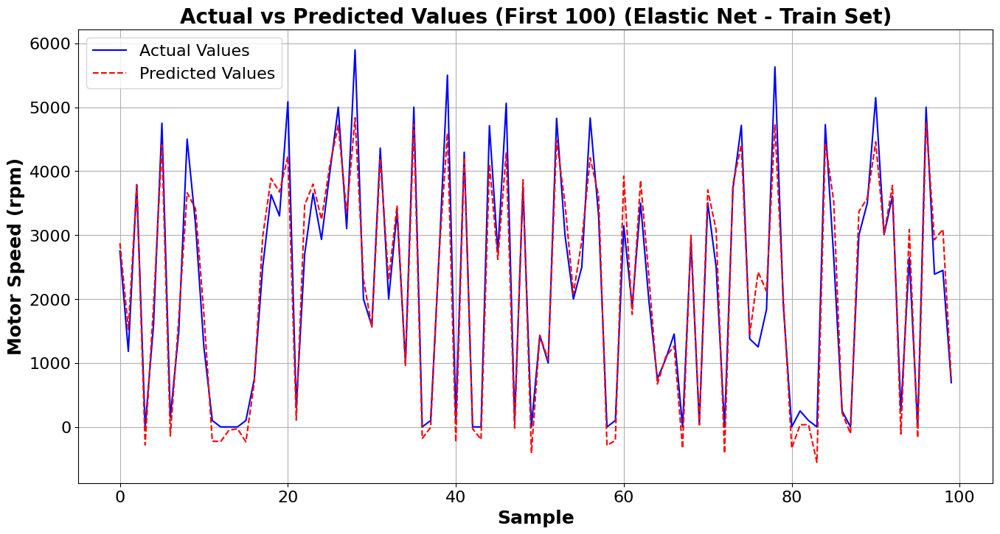

In [43]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_el[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Elastic Net - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

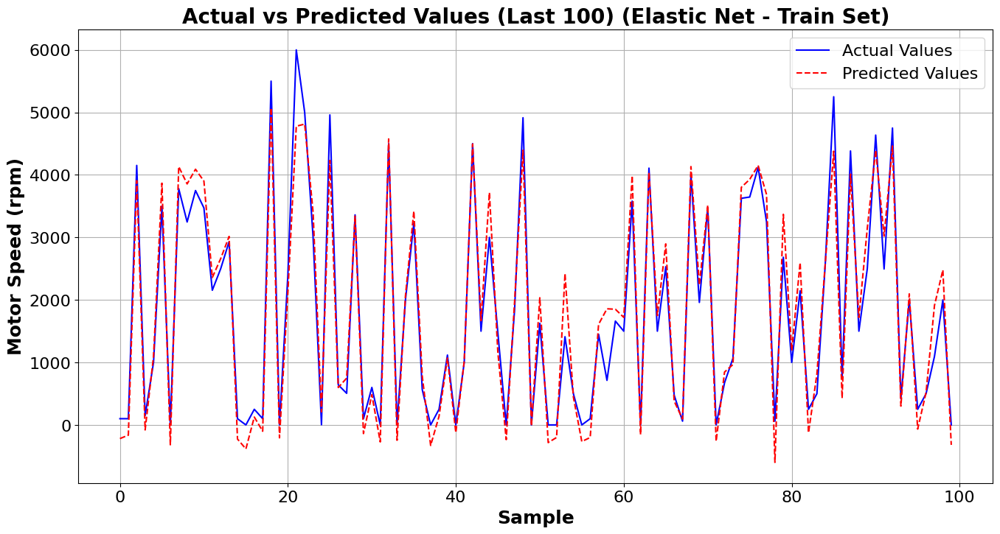

In [44]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_el[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Elastic Net - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

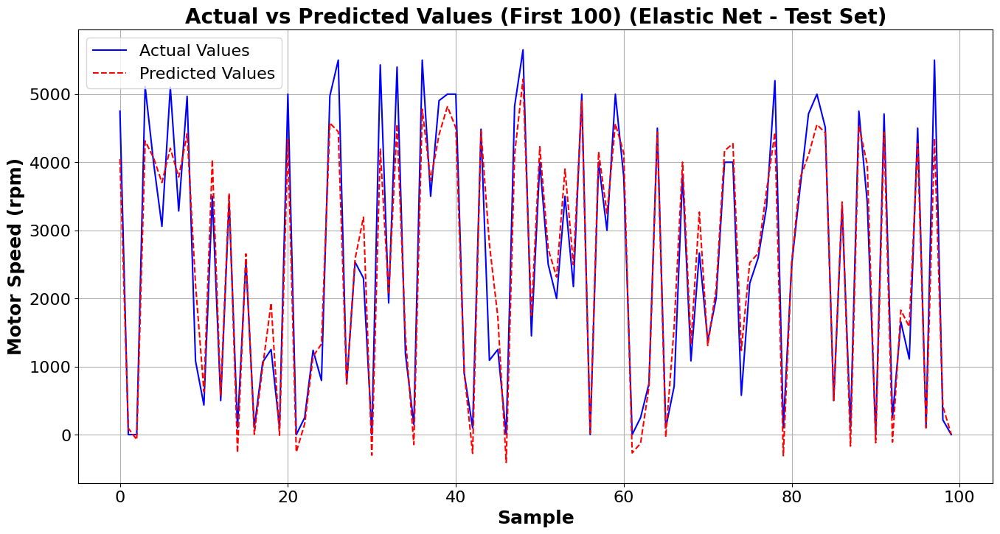

In [45]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_el[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Elastic Net - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

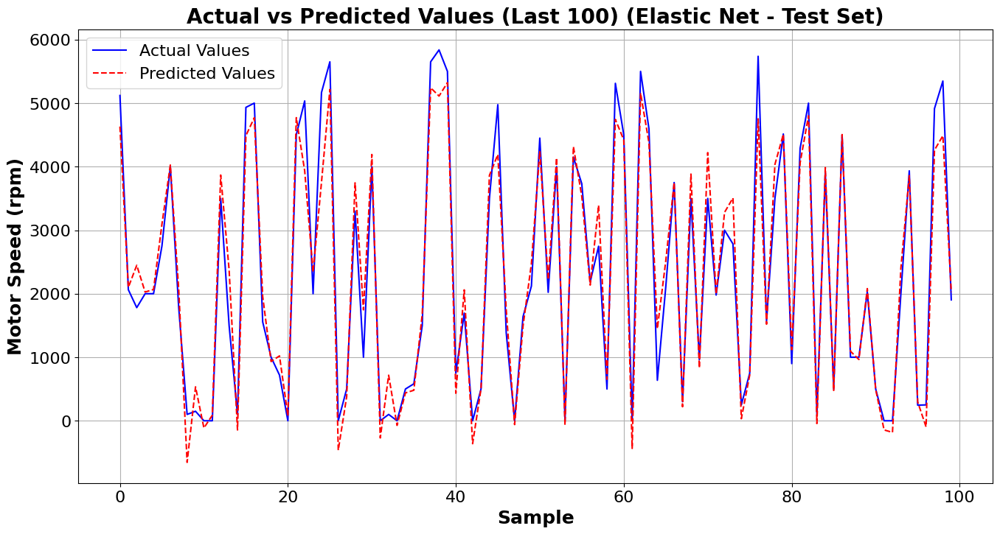

In [46]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_el[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Elastic Net - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [47]:
print('Coefficient and intercept for the model:')
print('Coefficients:',elnet_model.coef_) # type: ignore
print('Intercept:',elnet_model.intercept_) # type: ignore

Coefficient and intercept for the model:
Coefficients: [  996.55097082  -311.66523628 -1210.56848538   454.06679404
   700.6805393  -1662.50615622  3460.89746236   276.85688773
 -2621.90563723  -105.10989741  -869.84666918]
Intercept: 2203.227498988294


In [48]:
print('Final Equation:')
print('Speed = {}*u_q + {}*u_d + {}*i_d + \n{}*i_q + {}*coolant + {}*stator_winding + \n{}*stator_tooth + {}*pm + {}*stator_yoke + \n{}*ambient + {}*torque + {}'.format(\
          round(elnet_model.coef_[0],6), round(elnet_model.coef_[1],6), # type: ignore
          round(elnet_model.coef_[2],6), round(elnet_model.coef_[3],6), # type: ignore
          round(elnet_model.coef_[4],6), round(elnet_model.coef_[5],6), # type: ignore
          round(elnet_model.coef_[6],6), round(elnet_model.coef_[7],6), # type: ignore
          round(elnet_model.coef_[8],6), round(elnet_model.coef_[9],6), # type: ignore
          round(elnet_model.coef_[10],6), round(elnet_model.intercept_,6))) # type: ignore

Final Equation:
Speed = 996.550971*u_q + -311.665236*u_d + -1210.568485*i_d + 
454.066794*i_q + 700.680539*coolant + -1662.506156*stator_winding + 
3460.897462*stator_tooth + 276.856888*pm + -2621.905637*stator_yoke + 
-105.109897*ambient + -869.846669*torque + 2203.227499


In [49]:
# Saving the model
joblib.dump(elnet_model,'ElasticNet_Speed.pkl')

['ElasticNet_Speed.pkl']

## Linear SVR

In [ ]:
from sklearn.svm import LinearSVR

### Finding the Optimal Hyperparameters Using Halving Grid Search

In [ ]:
# Defining the parameter grid
parameters2 = {
    'tol': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'max_iter': [250, 500, 1000]
}

In [ ]:
halving_search2 = HalvingGridSearchCV(estimator=LinearSVR(),
                                     param_grid=parameters2,
                                     cv=5,
                                     factor=2,  
                                     n_jobs=-1,
                                     verbose=3)

halving_search2.fit(X_train_scaled, y_train)

n_iterations: 7
n_required_iterations: 7
n_possible_iterations: 7
min_resources_: 16635
max_resources_: 1064652
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 90
n_resources: 16635
Fitting 5 folds for each of 90 candidates, totalling 450 fits
----------
iter: 1
n_candidates: 45
n_resources: 33270
Fitting 5 folds for each of 45 candidates, totalling 225 fits
----------
iter: 2
n_candidates: 23
n_resources: 66540
Fitting 5 folds for each of 23 candidates, totalling 115 fits


d:\Python\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


----------
iter: 3
n_candidates: 12
n_resources: 133080
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 4
n_candidates: 6
n_resources: 266160
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 5
n_candidates: 3
n_resources: 532320
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 6
n_candidates: 2
n_resources: 1064640
Fitting 5 folds for each of 2 candidates, totalling 10 fits


HalvingGridSearchCV(estimator=LinearSVR(), factor=2, n_jobs=-1,
                    param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                                'max_iter': [250, 500, 1000],
                                'tol': [0.1, 0.01, 0.001, 0.0001, 1e-05]},
                    verbose=3)

In [ ]:
print('Best parameters found:', halving_search2.best_params_)

Best parameters found: {'C': 10, 'max_iter': 500, 'tol': 1e-05}


In [ ]:
# Creating the model with the optimal parameters
lsvr_model = halving_search2.best_estimator_

y_train_pred_lsvr = lsvr_model.predict(X_train_scaled) # type: ignore
y_test_pred_lsvr = lsvr_model.predict(X_test_scaled) # type: ignore

In [ ]:
mse_train_lsvr = mean_squared_error(y_train, y_train_pred_lsvr)
mse_test_lsvr = mean_squared_error(y_test, y_test_pred_lsvr)
r2_train_lsvr = r2_score(y_train, y_train_pred_lsvr)
r2_test_lsvr = r2_score(y_test, y_test_pred_lsvr)

print('Train MSE:', round(mse_train_lsvr, 6)) # type: ignore
print('Test MSE:', round(mse_test_lsvr, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_lsvr, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_lsvr, 6)) # type: ignore

Train MSE: 312431.267948
Test MSE: 314449.427085
Train R2 Score: 0.909695
Test R2 Score: 0.908926


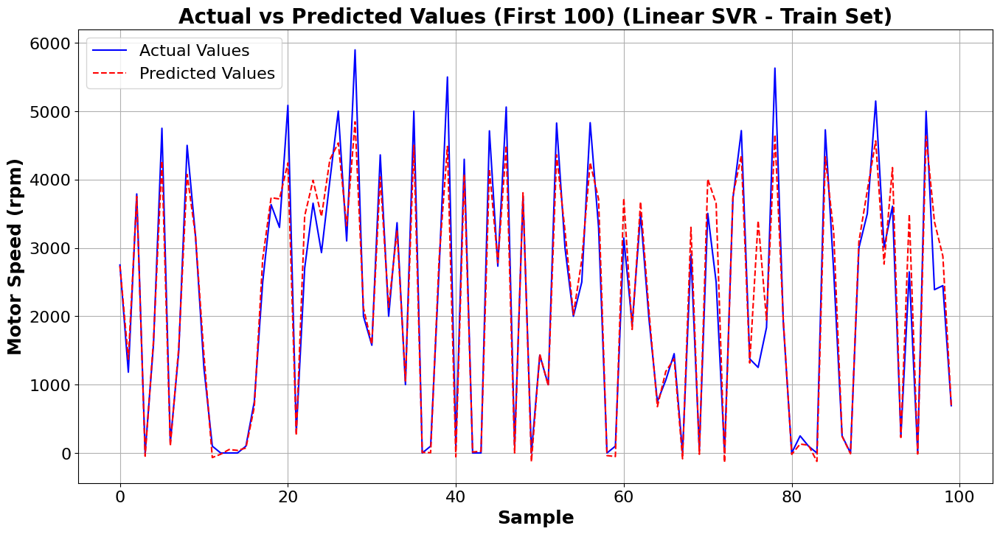

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_lsvr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Linear SVR - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

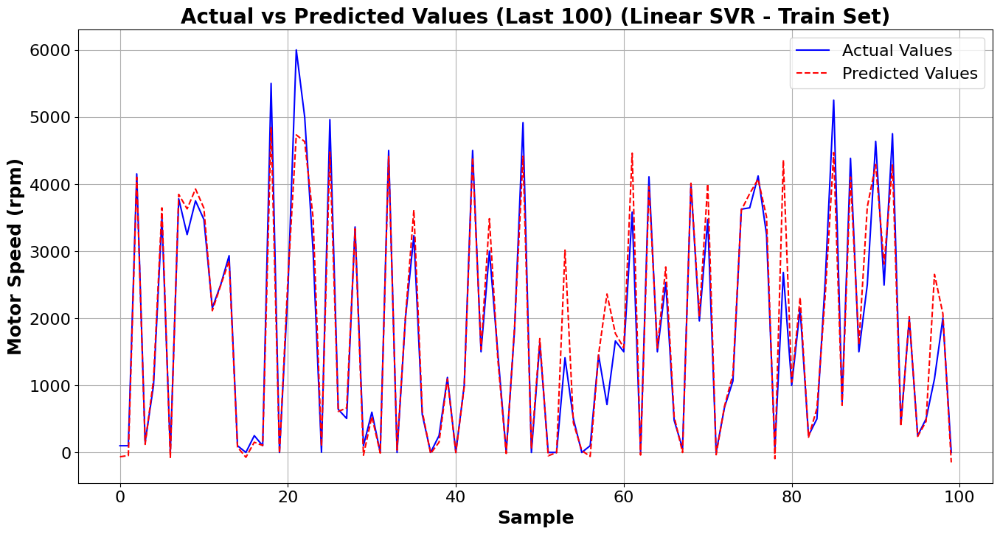

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_lsvr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Linear SVR - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

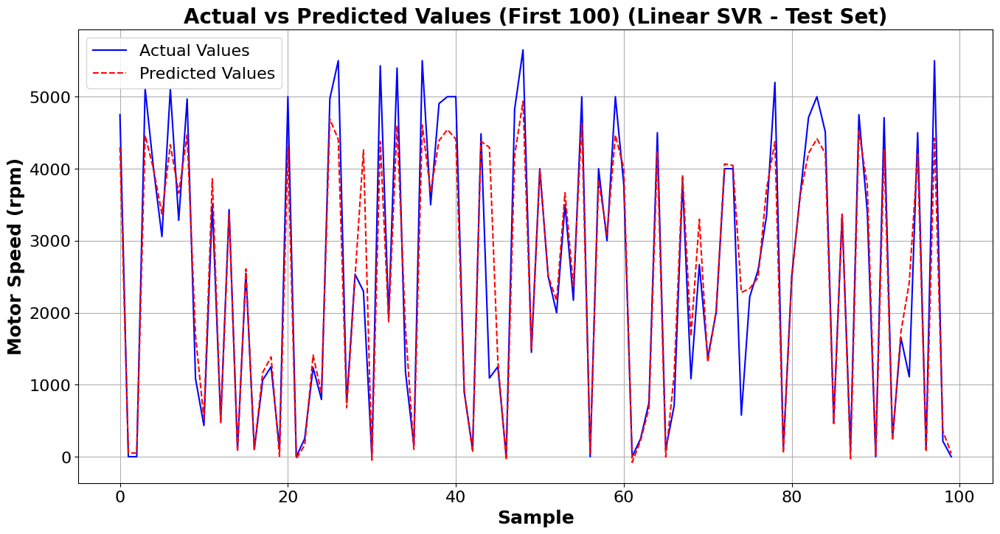

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_lsvr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Linear SVR - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

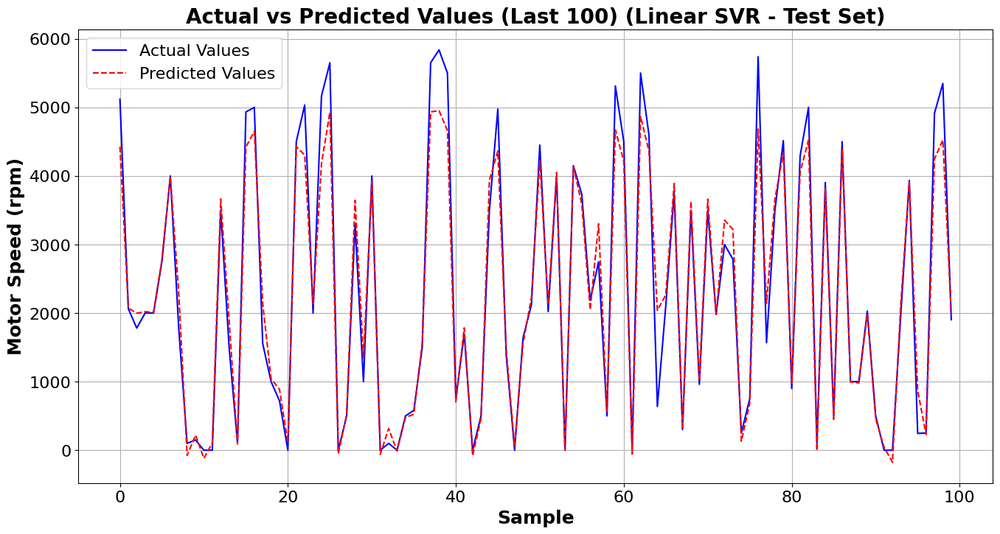

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_lsvr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Linear SVR - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [ ]:
print('Coefficient and intercept for the model:')
print('Coefficients:',lsvr_model.coef_)  # type: ignore
print('Intercept:',lsvr_model.intercept_) # type: ignore

Coefficient and intercept for the model:
Coefficients: [  879.83846674  -413.81863659 -1300.62649098   992.46364039
   161.53094065  -753.11407476  1309.24397688    42.0446961
  -781.58664222   -23.96494104 -1761.32948604]
Intercept: [2237.49684801]


In [ ]:
print('Final Equation:')
print('Speed = {}*u_q + {}*u_d + {}*i_d + \n{}*i_q + {}*coolant + {}*stator_winding + \n{}*stator_tooth + {}*pm + {}*stator_yoke + \n{}*ambient + {}*torque + {}'.format(\
          round(lsvr_model.coef_[0],6), round(lsvr_model.coef_[1],6), # type: ignore
          round(lsvr_model.coef_[2],6), round(lsvr_model.coef_[3],6), # type: ignore
          round(lsvr_model.coef_[4],6), round(lsvr_model.coef_[5],6), # type: ignore
          round(lsvr_model.coef_[6],6), round(lsvr_model.coef_[7],6), # type: ignore
          round(lsvr_model.coef_[8],6), round(lsvr_model.coef_[9],6), # type: ignore
          round(lsvr_model.coef_[10],6), round(lsvr_model.intercept_[0],6))) # type: ignore

Final Equation:
Speed = 879.838467*u_q + -413.818637*u_d + -1300.626491*i_d + 
992.46364*i_q + 161.530941*coolant + -753.114075*stator_winding + 
1309.243977*stator_tooth + 42.044696*pm + -781.586642*stator_yoke + 
-23.964941*ambient + -1761.329486*torque + 2237.496848


In [ ]:
# Saving the model
joblib.dump(lsvr_model,'LinearSVR_Speed.pkl')

['LinearSVR_Speed.pkl']

## Decision Tree Regressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor

### Finding the Optimal Hyperparameters Using Halving Grid Search

In [ ]:
# Defining the parameter grid
parameters3 = {
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error'],
    'max_depth': [None, 20, 40, 80, 100],
    'min_samples_split': [2, 4, 8, 16],
    'min_samples_leaf': [1, 2, 4, 8, 16]
}

In [ ]:
halving_search3 = HalvingGridSearchCV(estimator=DecisionTreeRegressor(),
                                     param_grid=parameters3,
                                     cv=5,
                                     factor=2,  
                                     n_jobs=-1,
                                     verbose=3)

halving_search3.fit(X_train_scaled, y_train)

n_iterations: 9
n_required_iterations: 9
n_possible_iterations: 9
min_resources_: 4158
max_resources_: 1064652
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 300
n_resources: 4158
Fitting 5 folds for each of 300 candidates, totalling 1500 fits


d:\Python\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


----------
iter: 1
n_candidates: 150
n_resources: 8316
Fitting 5 folds for each of 150 candidates, totalling 750 fits
----------
iter: 2
n_candidates: 75
n_resources: 16632
Fitting 5 folds for each of 75 candidates, totalling 375 fits
----------
iter: 3
n_candidates: 38
n_resources: 33264
Fitting 5 folds for each of 38 candidates, totalling 190 fits
----------
iter: 4
n_candidates: 19
n_resources: 66528
Fitting 5 folds for each of 19 candidates, totalling 95 fits
----------
iter: 5
n_candidates: 10
n_resources: 133056
Fitting 5 folds for each of 10 candidates, totalling 50 fits
----------
iter: 6
n_candidates: 5
n_resources: 266112
Fitting 5 folds for each of 5 candidates, totalling 25 fits
----------
iter: 7
n_candidates: 3
n_resources: 532224
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 8
n_candidates: 2
n_resources: 1064448
Fitting 5 folds for each of 2 candidates, totalling 10 fits


HalvingGridSearchCV(estimator=DecisionTreeRegressor(), factor=2, n_jobs=-1,
                    param_grid={'criterion': ['squared_error', 'friedman_mse',
                                              'absolute_error'],
                                'max_depth': [None, 20, 40, 80, 100],
                                'min_samples_leaf': [1, 2, 4, 8, 16],
                                'min_samples_split': [2, 4, 8, 16]},
                    verbose=3)

In [ ]:
print('Best parameters found:', halving_search3.best_params_)

Best parameters found: {'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 8}


In [ ]:
# Creating the model with the optimal parameters
dt_model = halving_search3.best_estimator_

y_train_pred_dt = dt_model.predict(X_train_scaled) # type: ignore
y_test_pred_dt = dt_model.predict(X_test_scaled) # type: ignore

In [ ]:
mse_train_dt = mean_squared_error(y_train, y_train_pred_dt)
mse_test_dt = mean_squared_error(y_test, y_test_pred_dt)
r2_train_dt = r2_score(y_train, y_train_pred_dt)
r2_test_dt = r2_score(y_test, y_test_pred_dt)

print('Train MSE:', round(mse_train_dt, 6)) # type: ignore
print('Test MSE:', round(mse_test_dt, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_dt, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_dt, 6)) # type: ignore

Train MSE: 131.68398
Test MSE: 825.982098
Train R2 Score: 0.999962
Test R2 Score: 0.999761


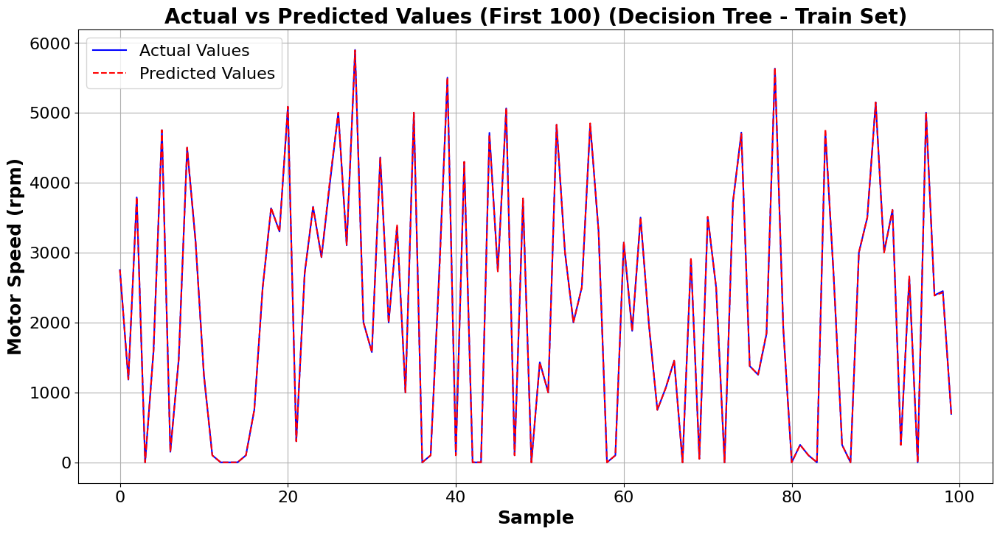

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_dt[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Decision Tree - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

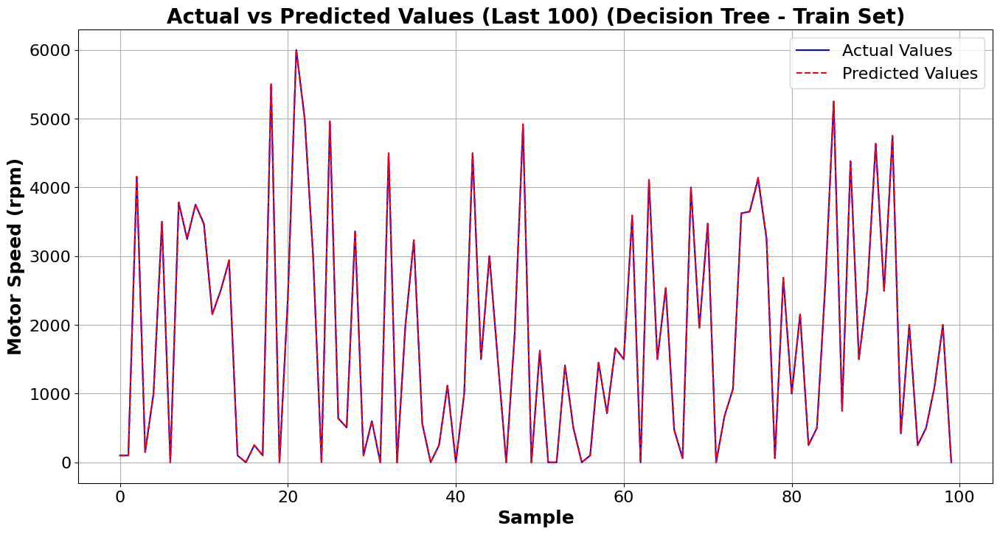

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_dt[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Decision Tree - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

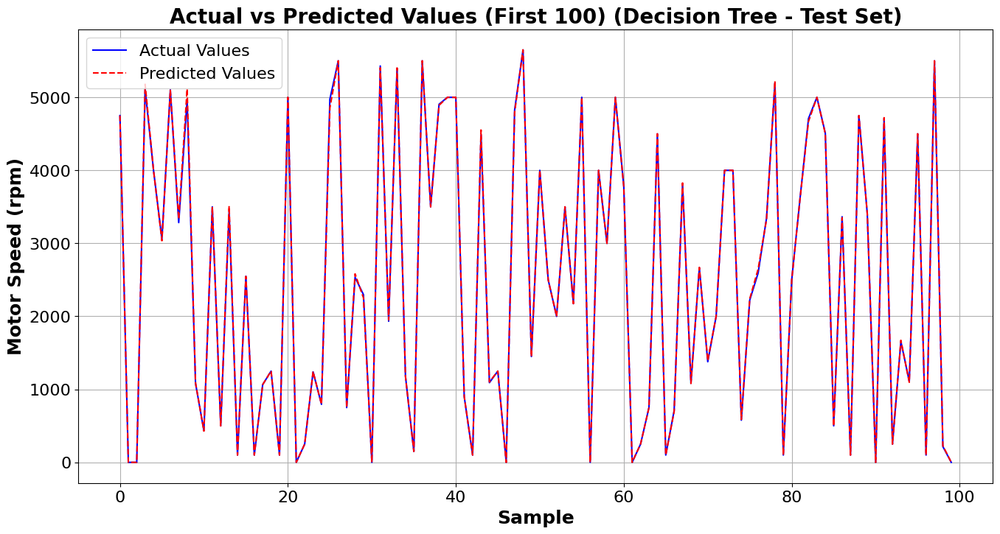

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_dt[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Decision Tree - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

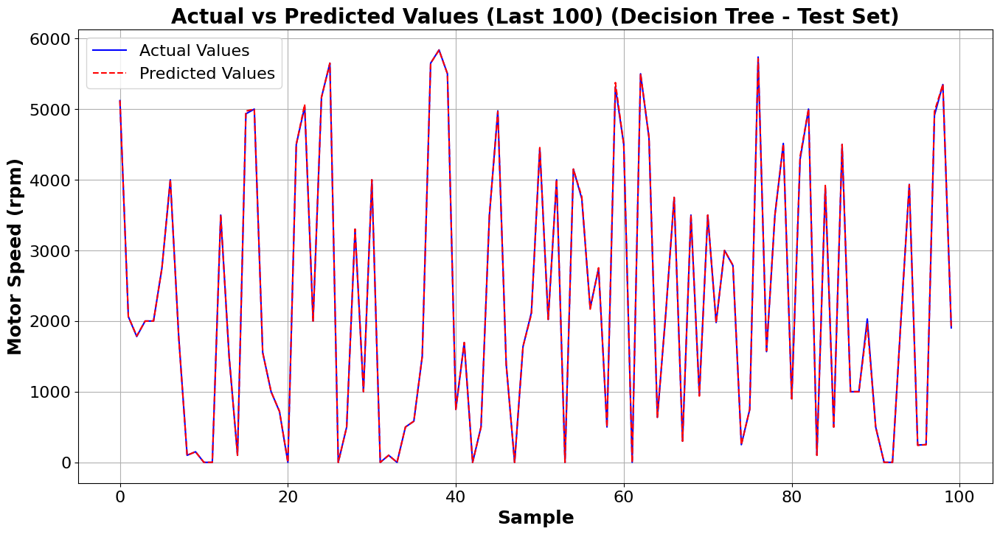

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_dt[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Decision Tree - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

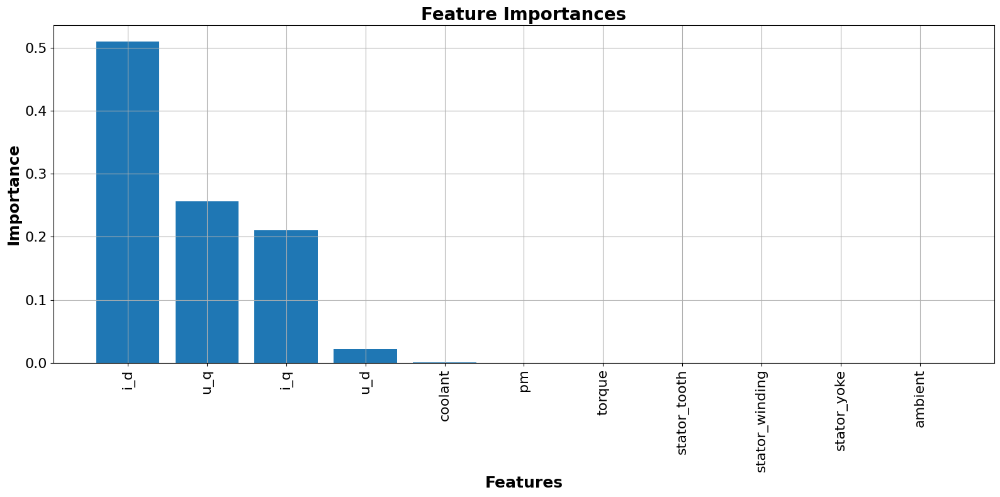

In [ ]:
feature_names = ['u_q', 'u_d', 'i_d', 'i_q', 'coolant', 'stator_winding', 'stator_tooth', 
         'pm', 'stator_yoke', 'ambient', 'torque'] 
importances = dt_model.feature_importances_ # type: ignore

indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(16, 8))
plt.title('Feature Importances', fontsize = 20, fontweight = 'bold')
plt.bar(range(len(importances)), importances[indices], align='center')
plt.xticks(range(len(importances)), np.array(feature_names)[indices], rotation=90, fontsize = 16) # type: ignore
plt.yticks(fontsize = 16)
plt.xlabel('Features', fontsize = 18, weight = 'bold')
plt.ylabel('Importance', fontsize = 18, weight = 'bold')
plt.tight_layout()
plt.grid(True)
plt.show()

In [ ]:
# Saving the model
joblib.dump(dt_model,'DecisionTree_Speed.pkl')

['DecisionTree_Speed.pkl']

## Bayesian Ridge Regression

In [ ]:
from sklearn.linear_model import BayesianRidge

### Finding the Optimal Hyperparameters Using Halving Grid Search

In [ ]:
# Defining the parameter grid
parameters4 = {
    'max_iter': [100, 200, 300, 400, 500],
    'tol': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5],
    'alpha_1': [1e-1, 1e-2, 1e-3, 1e-6],
    'alpha_2': [1e-1, 1e-2, 1e-3, 1e-6],
    'lambda_1': [1e-1, 1e-2, 1e-3, 1e-6],
    'lambda_2': [1e-1, 1e-2, 1e-3, 1e-6]
}

In [ ]:
halving_search4 = HalvingGridSearchCV(estimator=BayesianRidge(),
                                     param_grid=parameters4,
                                     cv=5,
                                     factor=2,  
                                     n_jobs=-1,
                                     verbose=3)

halving_search4.fit(X_train_scaled, y_train)

n_iterations: 13
n_required_iterations: 13
n_possible_iterations: 13
min_resources_: 259
max_resources_: 1064652
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 6400
n_resources: 259
Fitting 5 folds for each of 6400 candidates, totalling 32000 fits
----------
iter: 1
n_candidates: 3200
n_resources: 518
Fitting 5 folds for each of 3200 candidates, totalling 16000 fits
----------
iter: 2
n_candidates: 1600
n_resources: 1036
Fitting 5 folds for each of 1600 candidates, totalling 8000 fits
----------
iter: 3
n_candidates: 800
n_resources: 2072
Fitting 5 folds for each of 800 candidates, totalling 4000 fits
----------
iter: 4
n_candidates: 400
n_resources: 4144
Fitting 5 folds for each of 400 candidates, totalling 2000 fits
----------
iter: 5
n_candidates: 200
n_resources: 8288
Fitting 5 folds for each of 200 candidates, totalling 1000 fits
----------
iter: 6
n_candidates: 100
n_resources: 16576
Fitting 5 folds for each of 100 candidates, totalling 500 fits
--------

HalvingGridSearchCV(estimator=BayesianRidge(), factor=2, n_jobs=-1,
                    param_grid={'alpha_1': [0.1, 0.01, 0.001, 1e-06],
                                'alpha_2': [0.1, 0.01, 0.001, 1e-06],
                                'lambda_1': [0.1, 0.01, 0.001, 1e-06],
                                'lambda_2': [0.1, 0.01, 0.001, 1e-06],
                                'max_iter': [100, 200, 300, 400, 500],
                                'tol': [0.1, 0.01, 0.001, 0.0001, 1e-05]},
                    verbose=3)

In [ ]:
print('Best parameters found:', halving_search4.best_params_)

Best parameters found: {'alpha_1': 0.01, 'alpha_2': 1e-06, 'lambda_1': 1e-06, 'lambda_2': 0.001, 'max_iter': 200, 'tol': 0.1}


In [ ]:
# Creating the model with the optimal parameters
br_model = halving_search4.best_estimator_

y_train_pred_br = br_model.predict(X_train_scaled)  # type: ignore
y_test_pred_br = br_model.predict(X_test_scaled)  # type: ignore

In [ ]:
mse_train_br = mean_squared_error(y_train, y_train_pred_br)
mse_test_br = mean_squared_error(y_test, y_test_pred_br)
r2_train_br = r2_score(y_train, y_train_pred_br)
r2_test_br = r2_score(y_test, y_test_pred_br)

print('Train MSE:', round(mse_train_br, 6))   # type: ignore
print('Test MSE:', round(mse_test_br, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_br, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_br, 6)) # type: ignore

Train MSE: 218977.652202
Test MSE: 219977.003862
Train R2 Score: 0.936707
Test R2 Score: 0.936288


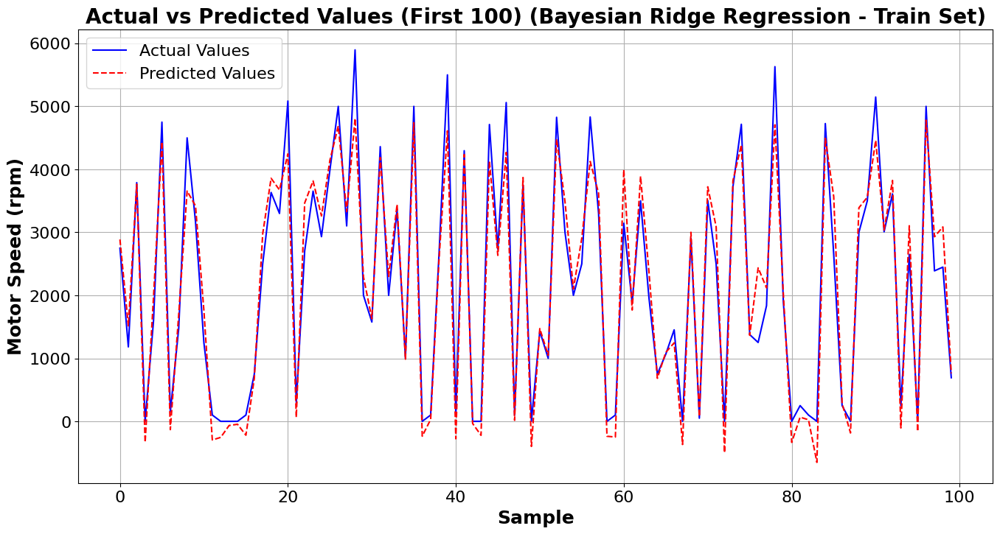

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_br[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Bayesian Ridge Regression - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

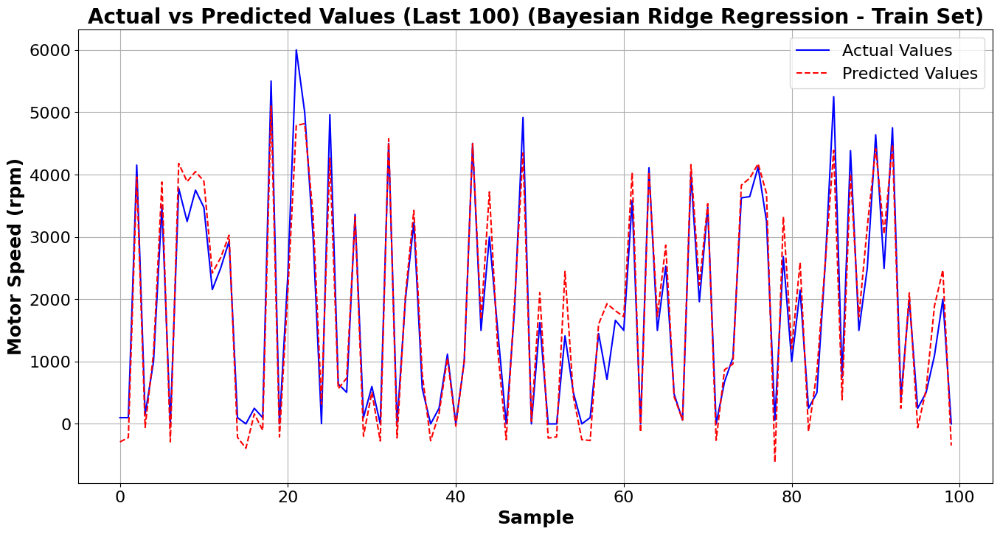

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_br[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Bayesian Ridge Regression - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

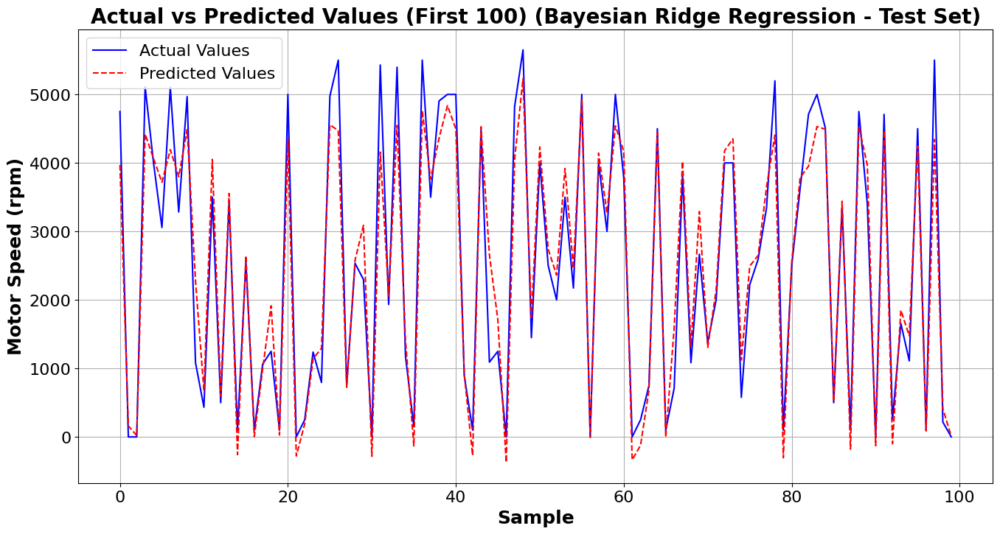

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_br[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Bayesian Ridge Regression - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

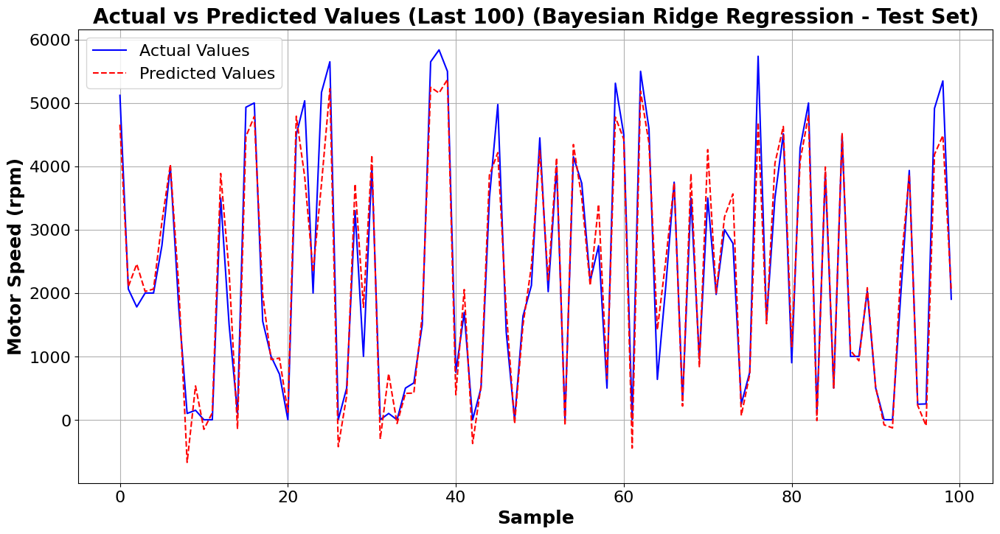

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_br[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Bayesian Ridge Regression - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [ ]:
print('Coefficient and intercept for the model:')
print('Coefficients:',br_model.coef_) # type: ignore
print('Intercept:',br_model.intercept_) # type: ignore

Coefficient and intercept for the model:
Coefficients: [  973.30123705  -284.22433951 -1216.78790804   392.13566283
   808.98413469 -2164.91377471  4509.39656981   233.73614868
 -3246.71370034  -103.76193635  -774.86571911]
Intercept: 2203.2274989880984


In [ ]:
print('Final Equation:')
print('Speed = {}*u_q + {}*u_d + {}*i_d + \n{}*i_q + {}*coolant + {}*stator_winding + \n{}*stator_tooth + {}*pm + {}*stator_yoke + \n{}*ambient + {}*torque + {}'.format(\
          round(br_model.coef_[0],6), round(br_model.coef_[1],6), # type: ignore
          round(br_model.coef_[2],6), round(br_model.coef_[3],6), # type: ignore
          round(br_model.coef_[4],6), round(br_model.coef_[5],6), # type: ignore
          round(br_model.coef_[6],6), round(br_model.coef_[7],6), # type: ignore
          round(br_model.coef_[8],6), round(br_model.coef_[9],6), # type: ignore
          round(br_model.coef_[10],6), round(br_model.intercept_,6))) # type: ignore

Final Equation:
Speed = 973.301237*u_q + -284.22434*u_d + -1216.787908*i_d + 
392.135663*i_q + 808.984135*coolant + -2164.913775*stator_winding + 
4509.39657*stator_tooth + 233.736149*pm + -3246.7137*stator_yoke + 
-103.761936*ambient + -774.865719*torque + 2203.227499


In [ ]:
# Saving the model
joblib.dump(br_model,'BayesianRidge_Speed.pkl')

['BayesianRidge_Speed.pkl']

## SGD Regressor

In [ ]:
from sklearn.linear_model import SGDRegressor

### Finding the Optimal Hyperparameters Using Halving Grid Search

In [ ]:
# Defining the parameter grid
parameters5 = {
    'alpha': [0.0001, 0.001, 0.01, 0.01, 1],
    'max_iter': [250, 500, 1000],
    'tol': [1e-1, 1e-2, 1e-3, 1e-6],
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'eta0': [0.1, 0.01, 0.001, 0.0001],
    'power_t': [0.25, 0.5, 0.75, 1, 2.5, 5],
    'early_stopping': [False, True],
}

In [ ]:
halving_search5 = HalvingGridSearchCV(estimator=SGDRegressor(),
                                     param_grid=parameters5,
                                     cv=5,
                                     factor=2,  
                                     n_jobs=-1,
                                     verbose=3)

halving_search5.fit(X_train_scaled, y_train)

n_iterations: 14
n_required_iterations: 14
n_possible_iterations: 14
min_resources_: 129
max_resources_: 1064652
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 11520
n_resources: 129
Fitting 5 folds for each of 11520 candidates, totalling 57600 fits
----------
iter: 1
n_candidates: 5760
n_resources: 258
Fitting 5 folds for each of 5760 candidates, totalling 28800 fits
----------
iter: 2
n_candidates: 2880
n_resources: 516
Fitting 5 folds for each of 2880 candidates, totalling 14400 fits


d:\Python\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


----------
iter: 3
n_candidates: 1440
n_resources: 1032
Fitting 5 folds for each of 1440 candidates, totalling 7200 fits
----------
iter: 4
n_candidates: 720
n_resources: 2064
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
----------
iter: 5
n_candidates: 360
n_resources: 4128
Fitting 5 folds for each of 360 candidates, totalling 1800 fits
----------
iter: 6
n_candidates: 180
n_resources: 8256
Fitting 5 folds for each of 180 candidates, totalling 900 fits
----------
iter: 7
n_candidates: 90
n_resources: 16512
Fitting 5 folds for each of 90 candidates, totalling 450 fits
----------
iter: 8
n_candidates: 45
n_resources: 33024
Fitting 5 folds for each of 45 candidates, totalling 225 fits
----------
iter: 9
n_candidates: 23
n_resources: 66048
Fitting 5 folds for each of 23 candidates, totalling 115 fits
----------
iter: 10
n_candidates: 12
n_resources: 132096
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 11
n_candidates: 6
n_resources: 26419

HalvingGridSearchCV(estimator=SGDRegressor(), factor=2, n_jobs=-1,
                    param_grid={'alpha': [0.0001, 0.001, 0.01, 0.01, 1],
                                'early_stopping': [False, True],
                                'eta0': [0.1, 0.01, 0.001, 0.0001],
                                'learning_rate': ['constant', 'optimal',
                                                  'invscaling', 'adaptive'],
                                'max_iter': [250, 500, 1000],
                                'power_t': [0.25, 0.5, 0.75, 1, 2.5, 5],
                                'tol': [0.1, 0.01, 0.001, 1e-06]},
                    verbose=3)

In [ ]:
print('Best parameters found:', halving_search5.best_params_)

Best parameters found: {'alpha': 0.0001, 'early_stopping': False, 'eta0': 0.1, 'learning_rate': 'adaptive', 'max_iter': 500, 'power_t': 0.25, 'tol': 0.001}


In [ ]:
# Creating the model with the optimal parameters
sgdr_model = halving_search5.best_estimator_

y_train_pred_sgdr = sgdr_model.predict(X_train_scaled) # type: ignore
y_test_pred_sgdr = sgdr_model.predict(X_test_scaled)  # type: ignore

In [ ]:
mse_train_sgdr = mean_squared_error(y_train, y_train_pred_sgdr)
mse_test_sgdr = mean_squared_error(y_test, y_test_pred_sgdr)
r2_train_sgdr = r2_score(y_train, y_train_pred_sgdr)
r2_test_sgdr = r2_score(y_test, y_test_pred_sgdr)

print('Train MSE:', round(mse_train_sgdr, 6)) # type: ignore
print('Test MSE:', round(mse_test_sgdr, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_sgdr, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_sgdr, 6)) # type: ignore

Train MSE: 219356.695489
Test MSE: 220232.669834
Train R2 Score: 0.936598
Test R2 Score: 0.936214


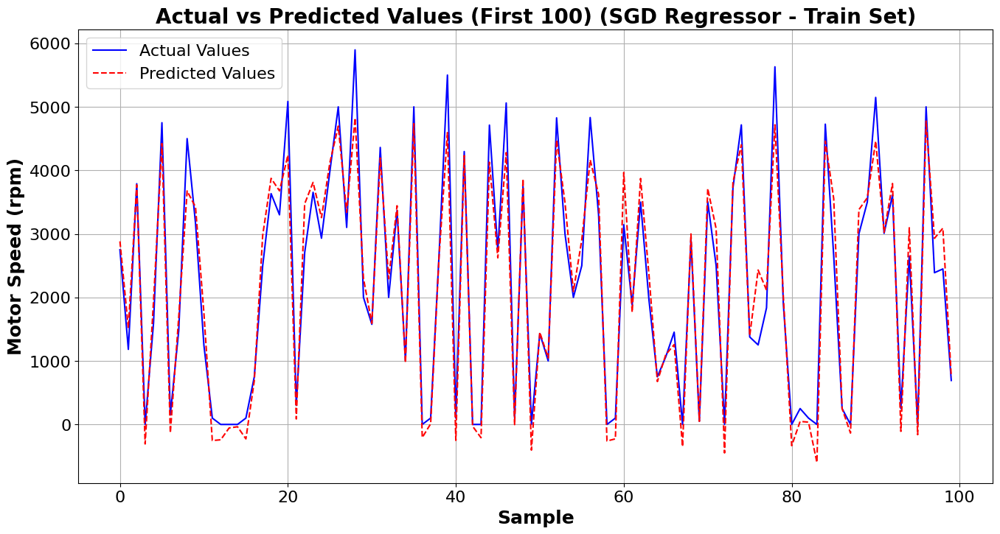

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_sgdr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (SGD Regressor - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

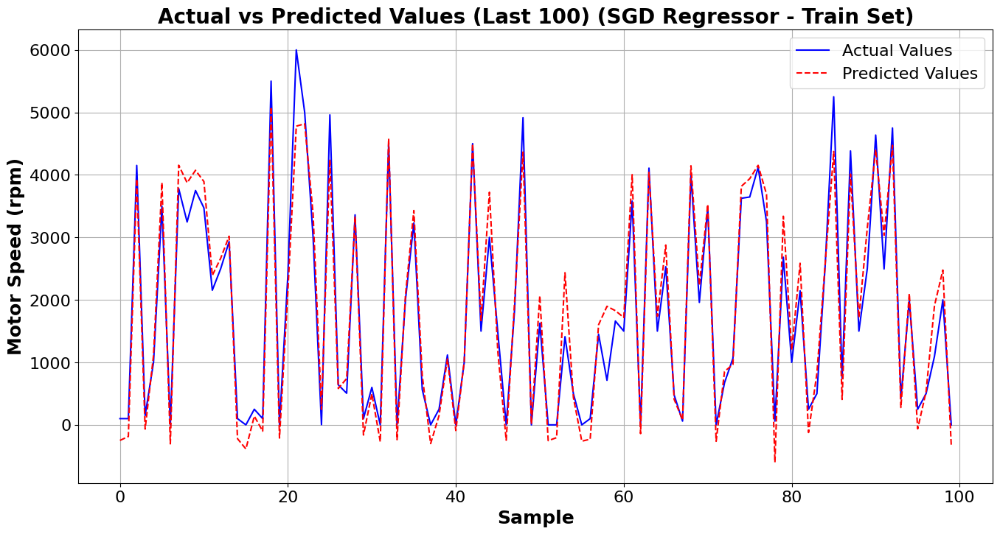

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_sgdr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (SGD Regressor - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

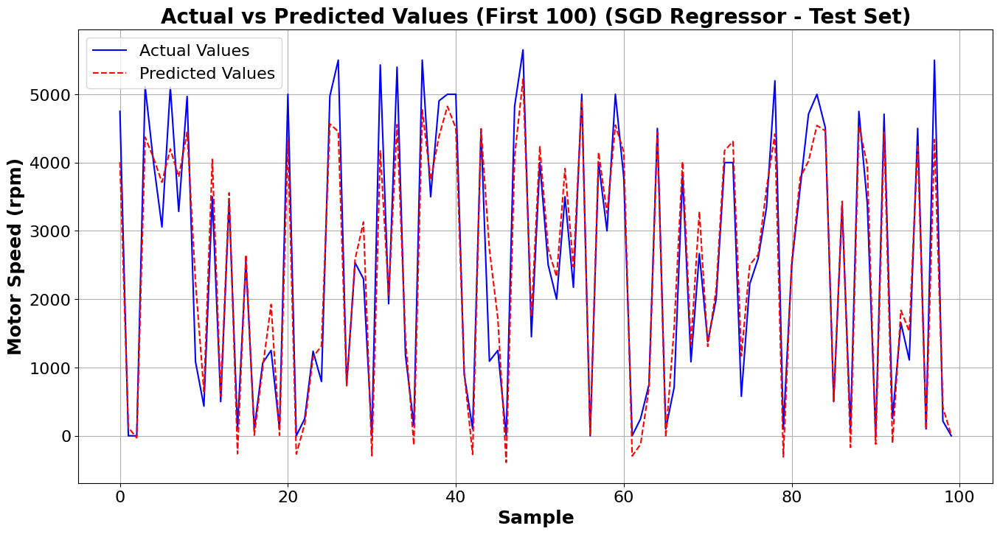

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_sgdr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (SGD Regressor - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

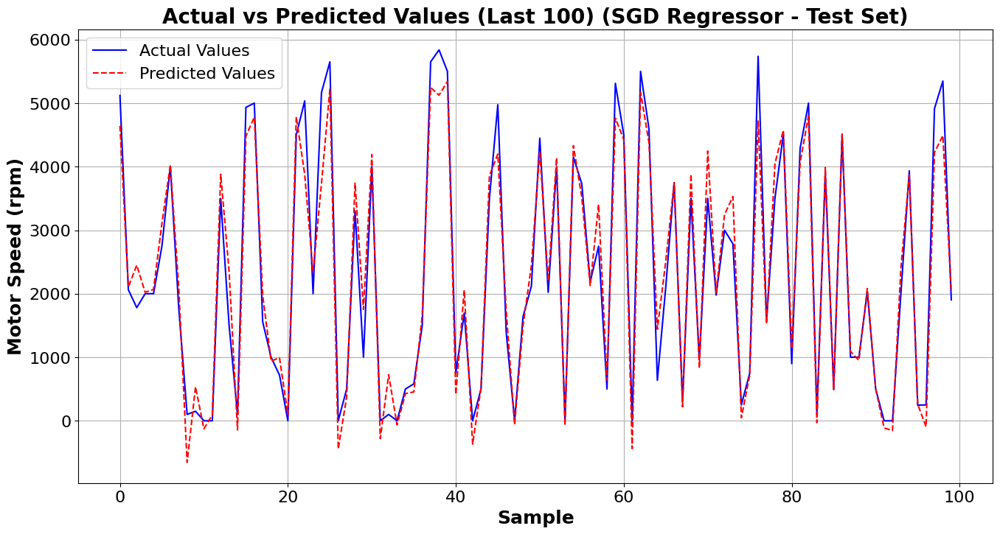

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_sgdr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (SGD Regressor - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [ ]:
print('Coefficient and intercept for the model:')
print('Coefficients:',sgdr_model.coef_) # type: ignore
print('Intercept:',sgdr_model.intercept_) # type: ignore

Coefficient and intercept for the model:
Coefficients: [  985.09402457  -295.9585115  -1216.09847014   384.56744721
   731.0854407  -1922.40396909  3948.59814126   256.27124898
 -2872.73694658  -105.17910495  -781.84102542]
Intercept: [2203.21419501]


In [ ]:
print('Final Equation:')
print('Speed = {}*u_q + {}*u_d + {}*i_d + \n{}*i_q + {}*coolant + {}*stator_winding + \n{}*stator_tooth + {}*pm + {}*stator_yoke + \n{}*ambient + {}*torque + {}'.format(\
          round(sgdr_model.coef_[0],6), round(sgdr_model.coef_[1],6), # type: ignore
          round(sgdr_model.coef_[2],6), round(sgdr_model.coef_[3],6), # type: ignore
          round(sgdr_model.coef_[4],6), round(sgdr_model.coef_[5],6), # type: ignore
          round(sgdr_model.coef_[6],6), round(sgdr_model.coef_[7],6), # type: ignore
          round(sgdr_model.coef_[8],6), round(sgdr_model.coef_[9],6), # type: ignore
          round(sgdr_model.coef_[10],6), round(sgdr_model.intercept_[0],6))) # type: ignore

Final Equation:
Speed = 985.094025*u_q + -295.958512*u_d + -1216.09847*i_d + 
384.567447*i_q + 731.085441*coolant + -1922.403969*stator_winding + 
3948.598141*stator_tooth + 256.271249*pm + -2872.736947*stator_yoke + 
-105.179105*ambient + -781.841025*torque + 2203.214195


In [ ]:
# Saving the model
joblib.dump(sgdr_model,'SGDRegressor_Speed.pkl')

['SGDRegressor_Speed.pkl']

## Neural Network

In [10]:
import keras
from keras.models import Sequential # type: ignore
from keras.layers import Input, Dense # type: ignore
from keras import optimizers

In [ ]:
# Splitting the training dataset further into a training subset and validation subset
X_train_nn, X_val_nn, y_train_nn, y_val_nn = train_test_split(X_train_scaled,
                                                              y_train,
                                                              test_size=0.2, 
                                                              shuffle=False,
                                                              random_state=0)

In [ ]:
# Designing the neural network
model = Sequential()
model.add(Input(shape=(X_train_nn.shape[1],)))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))

In [ ]:
# Compiling the model
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, 
              loss='mean_squared_error', 
              metrics=['mean_squared_error'])

# Training the model
history = model.fit(X_train_nn, y_train_nn, 
                    validation_data=(X_val_nn, y_val_nn), 
                    epochs=100, 
                    batch_size=512,
                    verbose=1)

Epoch 1/100
1664/1664 ━━━━━━━━━━━━━━━━━━━━ 2s 826us/step - loss: 7850038.5000 - mean_squared_error: 7850038.5000 - val_loss: 2133840.0000 - val_mean_squared_error: 2133840.0000
Epoch 2/100
1664/1664 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 1413804.8750 - mean_squared_error: 1413804.8750 - val_loss: 376838.5000 - val_mean_squared_error: 376838.5000
Epoch 3/100
1664/1664 ━━━━━━━━━━━━━━━━━━━━ 1s 750us/step - loss: 296468.6875 - mean_squared_error: 296468.6875 - val_loss: 184153.6875 - val_mean_squared_error: 184153.6875
Epoch 4/100
1664/1664 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 170238.9844 - mean_squared_error: 170238.9844 - val_loss: 143135.9062 - val_mean_squared_error: 143135.9062
Epoch 5/100
1664/1664 ━━━━━━━━━━━━━━━━━━━━ 1s 749us/step - loss: 132609.5625 - mean_squared_error: 132609.5625 - val_loss: 104746.8438 - val_mean_squared_error: 104746.8438
Epoch 6/100
1664/1664 ━━━━━━━━━━━━━━━━━━━━ 1s 749us/step - loss: 91905.4453 - mean_squared_error: 91905.4453 - val_loss: 56517.72

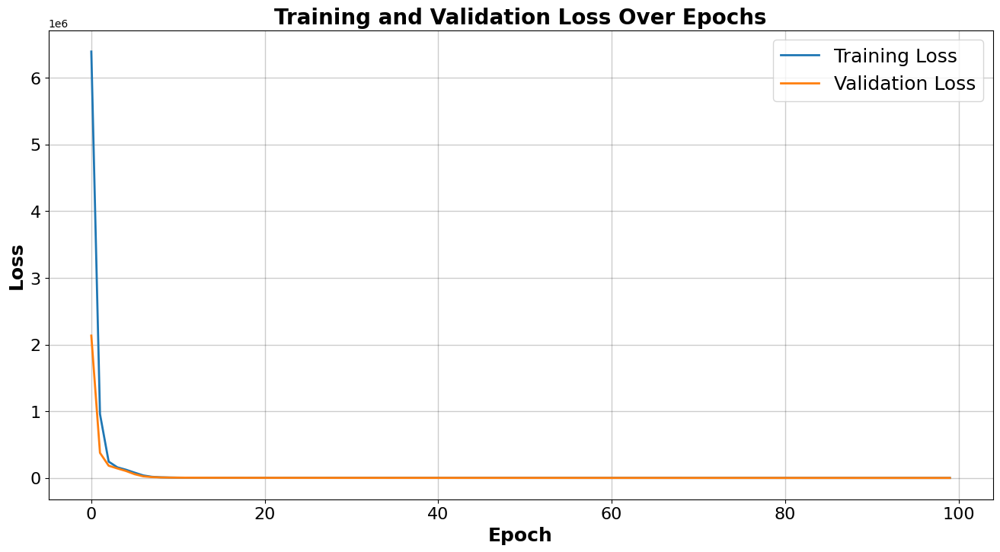

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(history.history['loss'], label='Training Loss', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
plt.xlabel('Epoch', color='black', fontsize=18, weight = 'bold')
plt.ylabel('Loss', color='black', fontsize=18, weight = 'bold')
plt.title('Training and Validation Loss Over Epochs', color='black', fontsize=20, fontweight = 'bold')
plt.legend(fontsize=18, ncol=1, loc='upper right')
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True, linewidth=1, color='black', alpha=0.2)
plt.show()

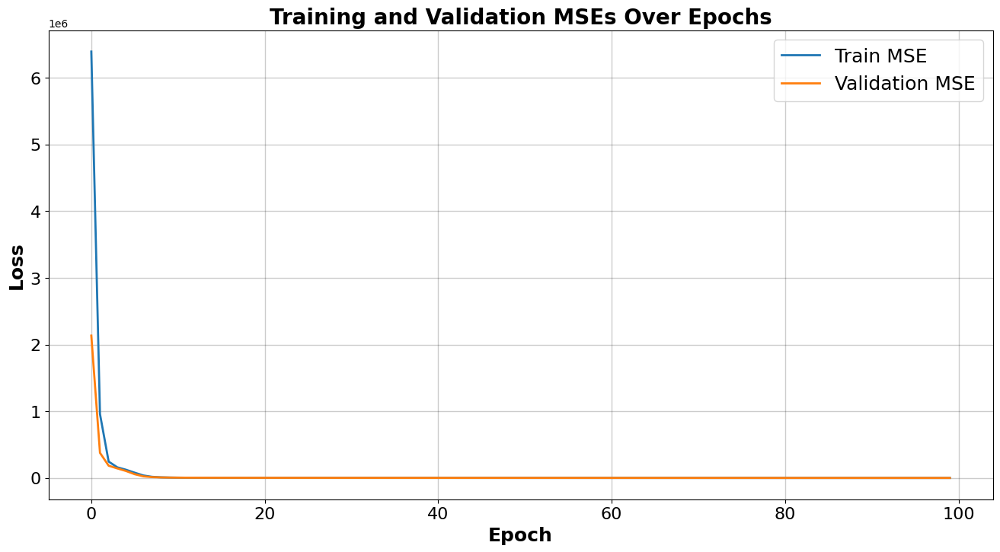

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(history.history['mean_squared_error'], label='Train MSE', linewidth=2)
plt.plot(history.history['val_mean_squared_error'], label='Validation MSE', linewidth=2)
plt.xlabel('Epoch', color='black', fontsize=18, weight = 'bold')
plt.ylabel('Loss', color='black', fontsize=18, weight = 'bold')
plt.title('Training and Validation MSEs Over Epochs', color='black', fontsize=20, fontweight = 'bold')
plt.legend(fontsize=18, ncol=1, loc='upper right')
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True, linewidth=1, color='black', alpha=0.2)
plt.show()

In [ ]:
y_train_pred_nnmd = model.predict(X_train_scaled)
y_test_pred_nnmd = model.predict(X_test_scaled)

33271/33271 ━━━━━━━━━━━━━━━━━━━━ 13s 380us/step
8318/8318 ━━━━━━━━━━━━━━━━━━━━ 3s 399us/step


In [ ]:
mse_train_nnmd = mean_squared_error(y_train, y_train_pred_nnmd)
mse_test_nnmd = mean_squared_error(y_test, y_test_pred_nnmd)
r2_train_nnmd = r2_score(y_train, y_train_pred_nnmd)
r2_test_nnmd = r2_score(y_test, y_test_pred_nnmd)

print('Train MSE:', round(mse_train_nnmd, 6)) # type: ignore
print('Test MSE:', round(mse_test_nnmd, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_nnmd, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_nnmd, 6)) # type: ignore

Train MSE: 725.778194
Test MSE: 808.079829
Train R2 Score: 0.99979
Test R2 Score: 0.999766


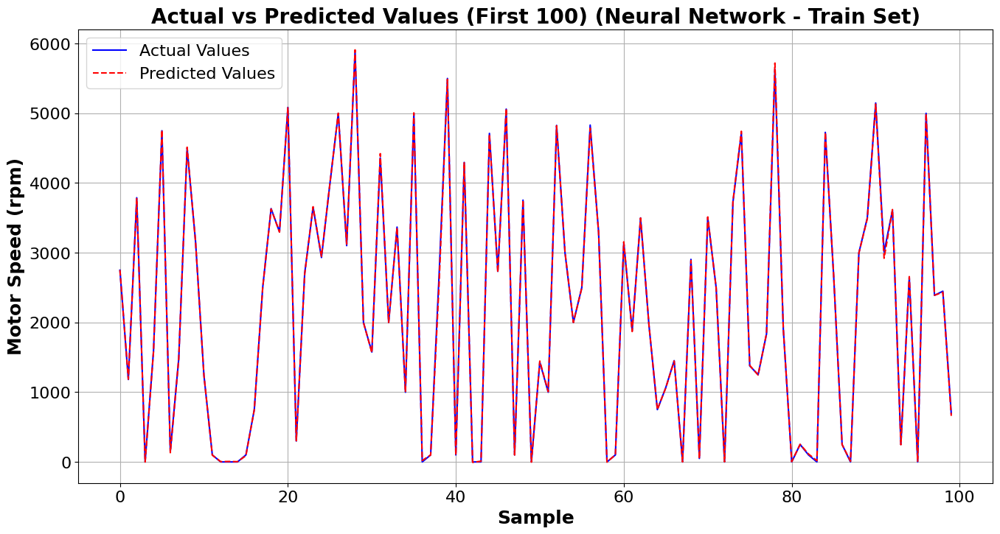

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_nnmd[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Neural Network - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

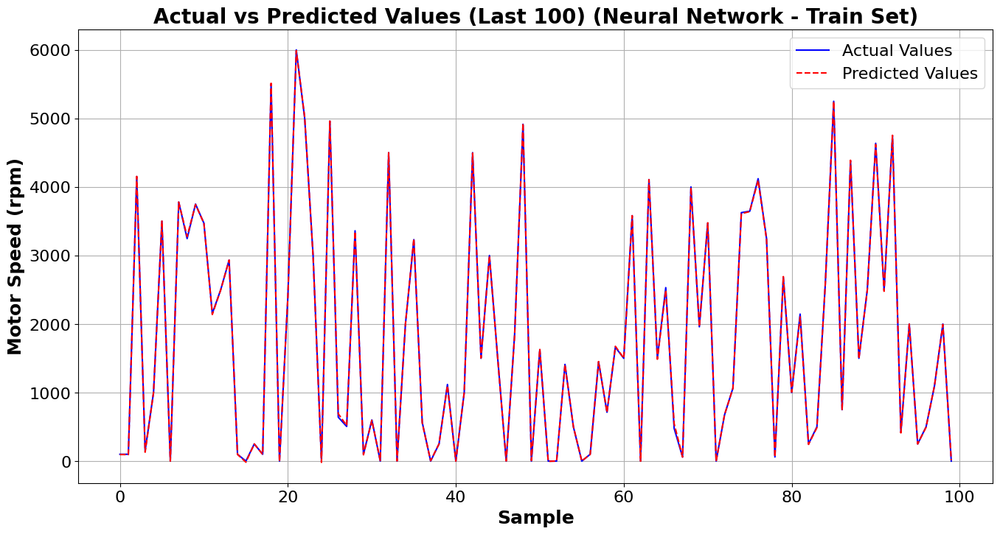

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_nnmd[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Neural Network - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

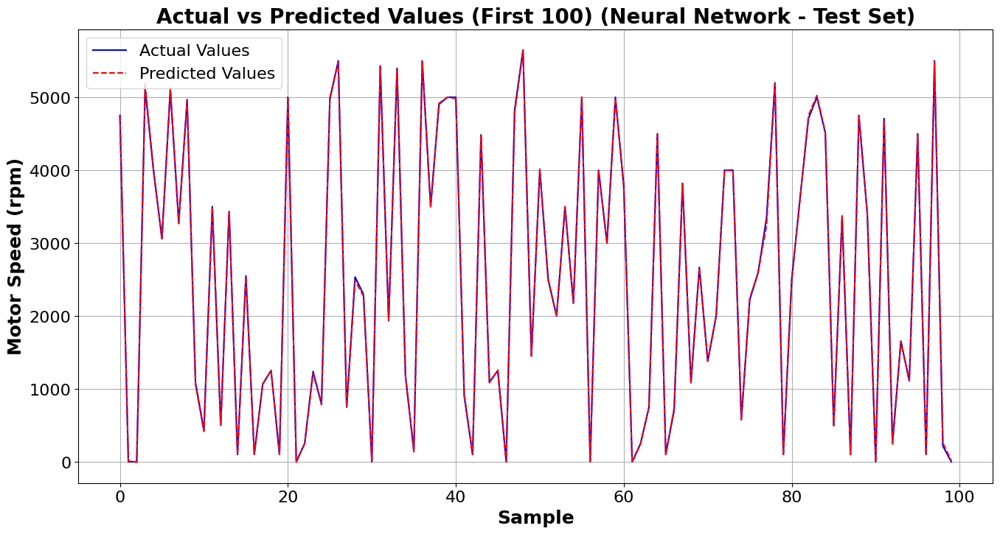

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_nnmd[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Neural Network - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

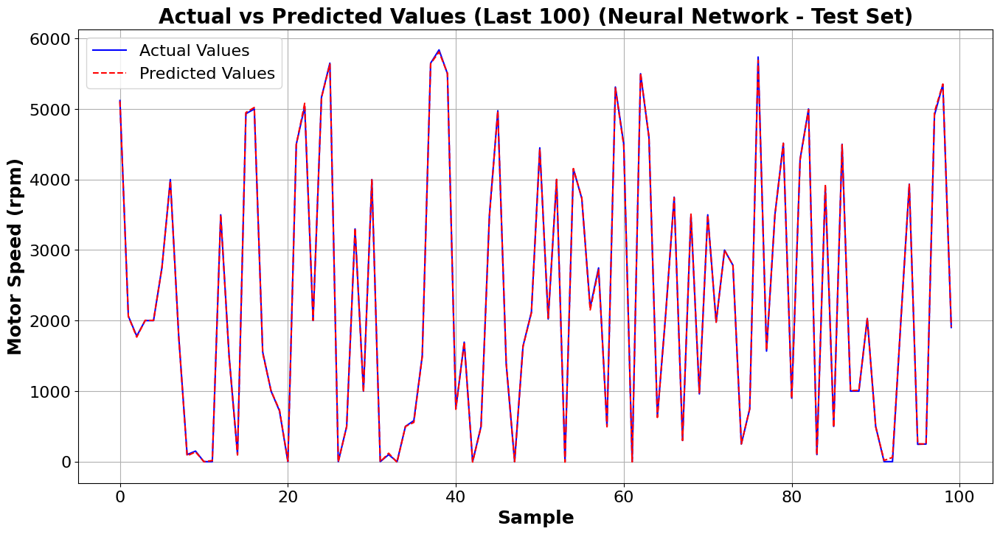

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_nnmd[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Neural Network - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [ ]:
# Saving the model
model.save('NN_ReLU_Speed.h5')

In [ ]:
from keras import models
nn_mod = models.load_model('NN_ReLU_Speed.h5')
nn_mod.summary() # type: ignore

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,523 (13.77 KB)

 Trainable params: 3,521 (13.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

## Gradient Boosting Regressor

In [10]:
from sklearn.ensemble import HistGradientBoostingRegressor

In [14]:
# Defining the parameter grid
parameters6 = {
    'loss': ['squared_error', 'absolute_error'],
    'learning_rate': [0.1, 0.25, 0.5, 1],
    'max_iter': [100, 250],
    'l2_regularization': [0, 0.25, 0.5, 1],
    'tol': [1e-5, 1e-6, 1e-7],
    'max_leaf_nodes': [31, 62],
    'min_samples_leaf': [20, 40]
}

In [15]:
halving_search6 = HalvingGridSearchCV(estimator=HistGradientBoostingRegressor(),
                                     param_grid=parameters6,
                                     cv=5,
                                     factor=2,  
                                     n_jobs=-1,
                                     verbose=3)

halving_search6.fit(X_train_scaled, y_train)

n_iterations: 10
n_required_iterations: 10
n_possible_iterations: 10
min_resources_: 2079
max_resources_: 1064652
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 768
n_resources: 2079
Fitting 5 folds for each of 768 candidates, totalling 3840 fits
----------
iter: 1
n_candidates: 384
n_resources: 4158
Fitting 5 folds for each of 384 candidates, totalling 1920 fits
----------
iter: 2
n_candidates: 192
n_resources: 8316
Fitting 5 folds for each of 192 candidates, totalling 960 fits
----------
iter: 3
n_candidates: 96
n_resources: 16632
Fitting 5 folds for each of 96 candidates, totalling 480 fits
----------
iter: 4
n_candidates: 48
n_resources: 33264
Fitting 5 folds for each of 48 candidates, totalling 240 fits
----------
iter: 5
n_candidates: 24
n_resources: 66528
Fitting 5 folds for each of 24 candidates, totalling 120 fits
----------
iter: 6
n_candidates: 12
n_resources: 133056
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 7
n_c

d:\Python\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


HalvingGridSearchCV(estimator=HistGradientBoostingRegressor(), factor=2,
                    n_jobs=-1,
                    param_grid={'l2_regularization': [0, 0.25, 0.5, 1],
                                'learning_rate': [0.1, 0.25, 0.5, 1],
                                'loss': ['squared_error', 'absolute_error'],
                                'max_iter': [100, 250],
                                'max_leaf_nodes': [31, 62],
                                'min_samples_leaf': [20, 40],
                                'tol': [1e-05, 1e-06, 1e-07]},
                    verbose=3)

In [16]:
print('Best parameters found:', halving_search6.best_params_)

Best parameters found: {'l2_regularization': 0.5, 'learning_rate': 0.25, 'loss': 'squared_error', 'max_iter': 250, 'max_leaf_nodes': 62, 'min_samples_leaf': 20, 'tol': 1e-06}


In [24]:
# Creating the model with the optimal parameters
hgbr_model = halving_search6.best_estimator_

y_train_pred_hgbr = hgbr_model.predict(X_train_scaled) # type: ignore
y_test_pred_hgbr = hgbr_model.predict(X_test_scaled) # type: ignore

In [25]:
mse_train_hgbr = mean_squared_error(y_train, y_train_pred_hgbr)
mse_test_hgbr = mean_squared_error(y_test, y_test_pred_hgbr)
r2_train_hgbr = r2_score(y_train, y_train_pred_hgbr)
r2_test_hgbr = r2_score(y_test, y_test_pred_hgbr)

print('Train MSE:', round(mse_train_hgbr, 6)) # type: ignore
print('Test MSE:', round(mse_test_hgbr, 6)) # type: ignore
print('Train R2 Score:', round(r2_train_hgbr, 6)) # type: ignore
print('Test R2 Score:', round(r2_test_hgbr, 6)) # type: ignore

Train MSE: 435.520003
Test MSE: 612.659493
Train R2 Score: 0.999874
Test R2 Score: 0.999823


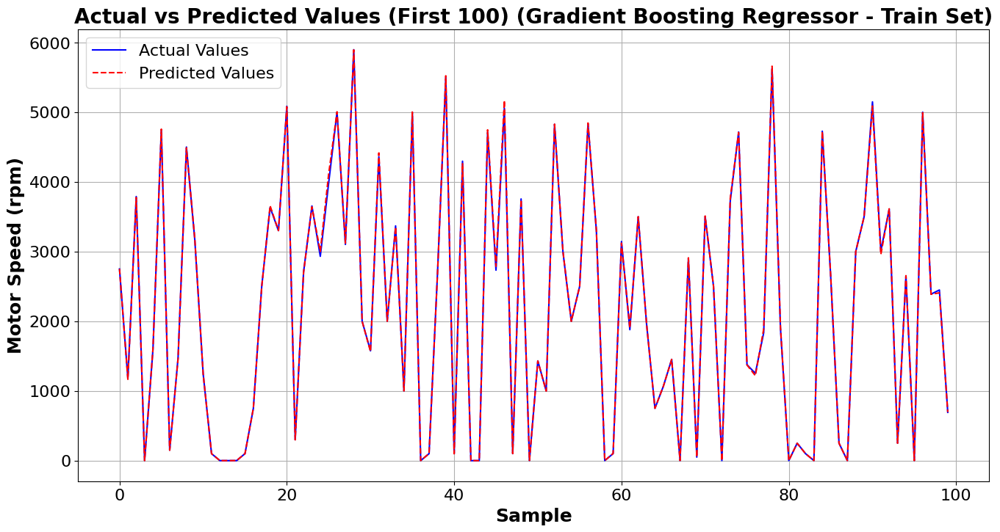

In [26]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[:100], label='Actual Values', color='blue')
plt.plot(y_train_pred_hgbr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Gradient Boosting Regressor - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

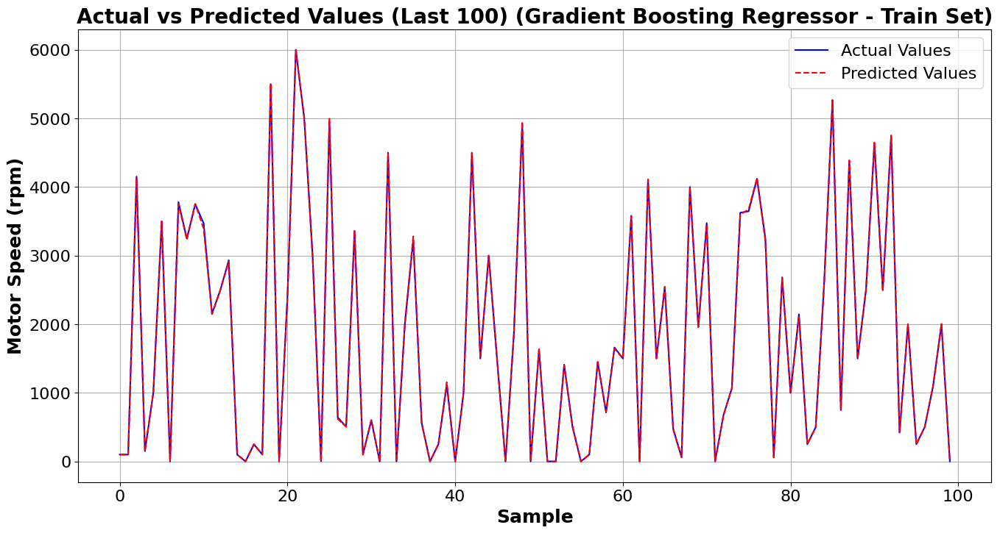

In [27]:
plt.figure(figsize=(16, 8))
plt.plot(y_train[-100:], label='Actual Values', color='blue')
plt.plot(y_train_pred_hgbr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Gradient Boosting Regressor - Train Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper right')
plt.grid(True)
plt.show()

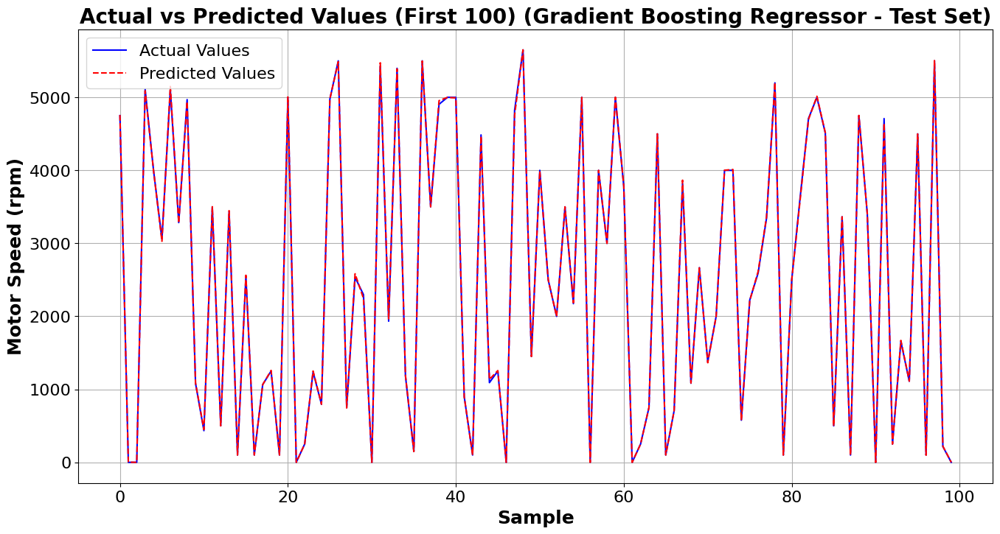

In [28]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[:100], label='Actual Values', color='blue')
plt.plot(y_test_pred_hgbr[:100], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (First 100) (Gradient Boosting Regressor - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

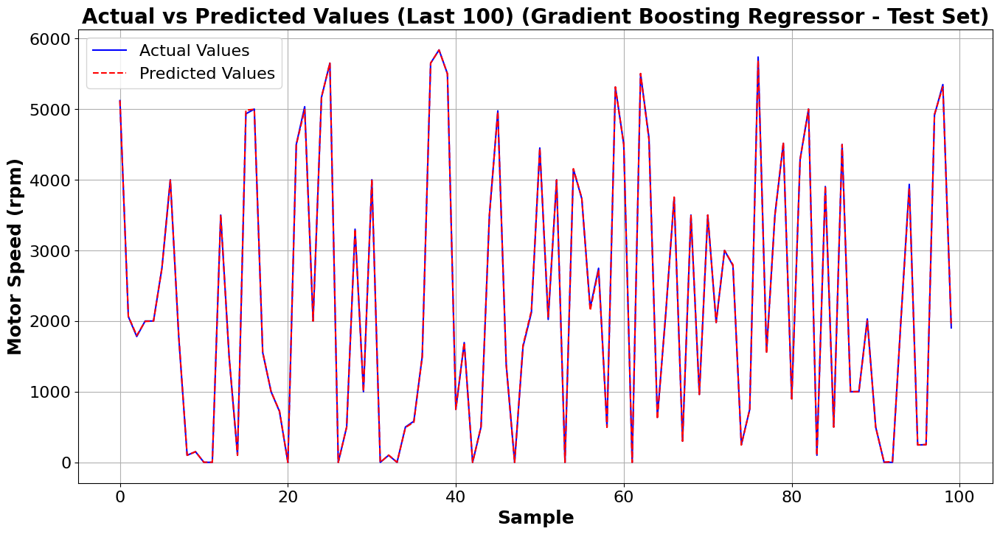

In [29]:
plt.figure(figsize=(16, 8))
plt.plot(y_test[-100:], label='Actual Values', color='blue')
plt.plot(y_test_pred_hgbr[-100:], label='Predicted Values', color='red', linestyle='--')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlabel('Sample', fontsize = 18, weight = 'bold')
plt.ylabel('Motor Speed (rpm)', fontsize = 18, weight = 'bold')
plt.title('Actual vs Predicted Values (Last 100) (Gradient Boosting Regressor - Test Set)', fontsize = 20, fontweight = 'bold')
plt.legend(fontsize=16, ncol=1, loc='upper left')
plt.grid(True)
plt.show()

In [30]:
# Saving the model
joblib.dump(hgbr_model,'HistGradientBoostingRegressor_Speed.pkl')

['HistGradientBoostingRegressor_Speed.pkl']

***